In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d 
from tabulate import tabulate
from skimage import exposure

In [2]:
def gaussian_blur_canny(image, kernel_size=5, canny_low=50, canny_high=150, use_clahe=True):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    if use_clahe:
        gray = apply_clahe(gray)
    
    blurred = cv2.GaussianBlur(gray, (kernel_size, kernel_size), 0)
    edges = cv2.Canny(blurred, canny_low, canny_high)
    
    return edges

def extract_shape_boundaries(image, kernel_size=5, min_area=100):
    contours, _ = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    result = np.zeros_like(image)
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area > min_area: 
            cv2.drawContours(result, [contour], -1, 255, 1)
    
    return result

def extract_inner_region(original_image, boundary_image):
    mask = boundary_image.copy()
    contours, _ = cv2.findContours(boundary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    for contour in contours:
        cv2.fillPoly(mask, [contour], 255)
    
    mask_normalized = mask.astype(np.float32) / 255.0
    
    if len(original_image.shape) == 3:  
        result = original_image.copy().astype(np.float32)
        for i in range(3):
            result[:, :, i] = result[:, :, i] * mask_normalized
        result = result.astype(np.uint8)
    else: 
        result = (original_image.astype(np.float32) * mask_normalized).astype(np.uint8)
    
    return result, mask

def extract_inner_region_cropped(original_image, boundary_image):
    inner_image, mask = extract_inner_region(original_image, boundary_image)
    contours, _ = cv2.findContours(boundary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) > 0:
        largest_contour = max(contours, key=cv2.contourArea)
        x, y, w, h = cv2.boundingRect(largest_contour)
        cropped = inner_image[y:y+h, x:x+w]
        return cropped, (x, y, w, h)
    
    return inner_image, None

def resize_image(image, target_size=512):
    h, w = image.shape[:2]
    scale = min(target_size / h, target_size / w)
    new_h, new_w = int(h * scale), int(w * scale)
    resized = cv2.resize(image, (new_w, new_h), interpolation=cv2.INTER_AREA)
    
    if len(resized.shape) == 3:
        canvas = np.zeros((target_size, target_size, resized.shape[2]), dtype=resized.dtype)
    else:
        canvas = np.zeros((target_size, target_size), dtype=resized.dtype)
    
    y_offset = (target_size - new_h) // 2
    x_offset = (target_size - new_w) // 2
    
    if len(resized.shape) == 3:
        canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w, :] = resized
    else:
        canvas[y_offset:y_offset+new_h, x_offset:x_offset+new_w] = resized
    
    return canvas

def apply_clahe(gray_image, clip_limit=2.0, tile_size=8):
    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=(tile_size, tile_size))
    return clahe.apply(gray_image)

In [3]:
def structural_similarity_score(test_image, train_image):
 
    if len(test_image.shape) == 3:
        test_gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)
    else:
        test_gray = test_image.copy()
    
    if len(train_image.shape) == 3:
        train_gray = cv2.cvtColor(train_image, cv2.COLOR_BGR2GRAY)
    else:
        train_gray = train_image.copy()
    
   
    test_gray = apply_clahe(test_gray, clip_limit=3.0, tile_size=8)
    train_gray = apply_clahe(train_gray, clip_limit=3.0, tile_size=8)
    
    test_gray = cv2.bilateralFilter(test_gray, 11, 80, 80)
    train_gray = cv2.bilateralFilter(train_gray, 11, 80, 80)
    
    test_edges = cv2.Canny(test_gray, 50, 150)
    train_edges = cv2.Canny(train_gray, 50, 150)
    
    test_edges_norm = test_edges.astype(np.float32) / 255.0
    train_edges_norm = train_edges.astype(np.float32) / 255.0
    
    # Calculate edge overlap
    edge_intersection = np.sum(test_edges_norm * train_edges_norm)
    edge_union = np.sum(np.maximum(test_edges_norm, train_edges_norm))
    edge_similarity = edge_intersection / (edge_union + 1e-10)
    
    # 2. Normalized cross-correlation on grayscale
    test_norm = (test_gray - np.mean(test_gray)) / (np.std(test_gray) + 1e-10)
    train_norm = (train_gray - np.mean(train_gray)) / (np.std(train_gray) + 1e-10)
    ncc = np.sum(test_norm * train_norm) / (test_norm.size)
    ncc_score = (ncc + 1) / 2  
    
    combined = 0.7 * edge_similarity + 0.3 * ncc_score
    return combined

In [4]:
def match_histograms(source, reference):

    if len(source.shape) == 3:
        source_gray = cv2.cvtColor(source, cv2.COLOR_BGR2GRAY)
    else:
        source_gray = source.copy()
    
    if len(reference.shape) == 3:
        reference_gray = cv2.cvtColor(reference, cv2.COLOR_BGR2GRAY)
    else:
        reference_gray = reference.copy()
    
    matched = exposure.match_histograms(source_gray, reference_gray, channel_axis=None)
    matched = np.uint8(matched)
    
    return matched

In [5]:
def prepare_matching_image(image, method='clahe_hist'):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    gray = np.clip(gray.astype(np.float32), 0, 255).astype(np.uint8)
    
    if method == 'clahe_hist':
        gray = apply_clahe(gray, clip_limit=2.0, tile_size=8)
        gray = cv2.equalizeHist(gray)
        gray = np.clip(gray.astype(np.float32), 0, 255).astype(np.uint8)
        return gray
    
    elif method == 'edge':
        # Edge detection for structural matching
        gray = apply_clahe(gray, clip_limit=3.0, tile_size=8)
        gray = cv2.bilateralFilter(gray, 9, 75, 75)
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        edges = cv2.Canny(blurred, 30, 100)
        kernel = np.ones((2,2), np.uint8)
        edges = cv2.dilate(edges, kernel, iterations=1)
        return edges
    

In [6]:
def template_match(test_image, training_image, method=cv2.TM_CCOEFF_NORMED, prep_method='clahe_hist', use_histogram_matching=False):

    if use_histogram_matching:
        test_image = match_histograms(test_image, training_image)
    
    test_gray = prepare_matching_image(test_image, method=prep_method)
    train_gray = prepare_matching_image(training_image, method=prep_method)
    
    if test_gray.shape[0] > train_gray.shape[0] or test_gray.shape[1] > train_gray.shape[1]:
        test_gray, train_gray = train_gray, test_gray
    
    result = cv2.matchTemplate(train_gray, test_gray, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    
    return max_val, test_gray, train_gray

In [7]:
def process_image_pipeline(image_path, plot_intermediate=False, title="", min_area=500, target_size=512):
    """Complete pipeline: read -> resize -> detect edges -> extract region -> crop"""
    img = cv2.imread(image_path, 1)
    img = resize_image(img, target_size=target_size)
    edges = gaussian_blur_canny(img)
    boundaries = extract_shape_boundaries(edges, min_area=min_area)
    cropped_region, bbox = extract_inner_region_cropped(img, boundaries)
    
    if cropped_region is None:
        inner_region, mask = extract_inner_region(img, boundaries)
        cropped_region = inner_region
    
    cropped_region = resize_image(cropped_region, target_size=target_size)
    
    if plot_intermediate:
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            gray = img.copy()
        
        blurred = cv2.GaussianBlur(gray, (5, 5), 0)
        
        fig, axes = plt.subplots(2, 4, figsize=(16, 8))
        fig.suptitle(f'Processing Pipeline: {title}', fontsize=14, fontweight='bold')
        
        axes[0, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[0, 0].set_title('Original (Resized 512x512)')
        axes[0, 0].axis('off')
        
        axes[0, 1].imshow(gray, cmap='gray')
        axes[0, 1].set_title('Grayscale')
        axes[0, 1].axis('off')
        
        axes[0, 2].imshow(blurred, cmap='gray')
        axes[0, 2].set_title('Gaussian Blur')
        axes[0, 2].axis('off')
        
        axes[0, 3].imshow(edges, cmap='gray')
        axes[0, 3].set_title('Canny Edges')
        axes[0, 3].axis('off')
        
        axes[1, 0].imshow(boundaries, cmap='gray')
        axes[1, 0].set_title('Shape Boundaries')
        axes[1, 0].axis('off')
        
        inner_region, mask = extract_inner_region(img, boundaries)
        axes[1, 1].imshow(cv2.cvtColor(inner_region, cv2.COLOR_BGR2RGB))
        axes[1, 1].set_title('Inner Region')
        axes[1, 1].axis('off')
        
        if len(cropped_region.shape) == 3:
            axes[1, 2].imshow(cv2.cvtColor(cropped_region, cv2.COLOR_BGR2RGB))
        else:
            axes[1, 2].imshow(cropped_region, cmap='gray')
        axes[1, 2].set_title('Cropped & Resized (512x512)')
        axes[1, 2].axis('off')
        
        axes[1, 3].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    return cropped_region


In [8]:
def plot_matching_images(test_name, test_gray, train_names, train_grays, scores, normalized_scores, best_idx, prep_method, use_hist_match):
    n_trains = len(train_names)
    fig, axes = plt.subplots(2, n_trains + 1, figsize=(4 * (n_trains + 1), 8))
    
    method_names = {
        'clahe_hist': 'CLAHE + Histogram Equalization',
        'edge': 'Edge Detection (Canny)',
    }
    
    hist_match_str = " + Histogram Matching" if use_hist_match else ""
    fig.suptitle(f'Template Matching Images for Test: {test_name}\nPreprocessing: {method_names.get(prep_method, prep_method)}{hist_match_str}', 
                 fontsize=14, fontweight='bold')
    
    axes[0, 0].imshow(test_gray, cmap='gray')
    axes[0, 0].set_title(f'Test: {test_name}\n(After Preprocessing)', fontweight='bold', fontsize=11)
    axes[0, 0].axis('off')
    axes[1, 0].axis('off')
    
    # Remaining columns: Training images with scores
    for i, (name, train_gray, score, norm_score) in enumerate(zip(train_names, train_grays, scores, normalized_scores)):
        col = i + 1
        
        # Top row: Training image
        axes[0, col].imshow(train_gray, cmap='gray')
        title_color = 'green' if i == best_idx else 'black'
        axes[0, col].set_title(f'Train: {name}\n(After Preprocessing)', 
                               fontweight='bold' if i == best_idx else 'normal',
                               color=title_color, fontsize=11)
        axes[0, col].axis('off')
        
        # Bottom row: Score with percentage
        score_text = f'Score: {score:.4f}\n({norm_score:.1f}%)'
        axes[1, col].text(0.5, 0.5, score_text, 
                         ha='center', va='center', fontsize=12, fontweight='bold',
                         color=title_color,
                         transform=axes[1, col].transAxes)
        axes[1, col].axis('off')
    
    plt.tight_layout()
    plt.show()


In [9]:
def plot_score_comparison(test_name, training_names, scores, normalized_scores, best_idx, threshold, prep_method, use_hist_match):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))
    
    hist_match_str = " + Histogram Matching" if use_hist_match else ""
    fig.suptitle(f'Template Matching Scores for Test: {test_name}\nPreprocessing: {prep_method}{hist_match_str}', 
                fontsize=14, fontweight='bold')
    
    # Left plot: Raw scores
    colors = ['green' if i == best_idx else 'steelblue' for i in range(len(scores))]
    bars1 = ax1.bar(training_names, scores, color=colors, alpha=0.7, edgecolor='black', linewidth=1.5)
    
    ax1.axhline(y=threshold, color='red', linestyle='--', linewidth=2, label=f'Threshold ({threshold})')
    
    for bar, score in zip(bars1, scores):
        height = bar.get_height()
        ax1.text(bar.get_x() + bar.get_width()/2., height,
                f'{score:.4f}',
                ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    ax1.set_ylabel('Average Score', fontsize=12, fontweight='bold')
    ax1.set_xlabel('Training Classes', fontsize=12, fontweight='bold')
    ax1.set_title('Raw Scores (Average across variants)', fontsize=12, fontweight='bold')
    ax1.legend(fontsize=11)
    ax1.grid(axis='y', alpha=0.3)
    ax1.set_ylim([0, max(scores) * 1.2])
    
    # Right plot: Normalized percentages
    bars2 = ax2.bar(training_names, normalized_scores, color=colors, alpha=0.7, edgecolor='black', linewidth=1.5)
    
    for bar, norm_score in zip(bars2, normalized_scores):
        height = bar.get_height()
        ax2.text(bar.get_x() + bar.get_width()/2., height,
                f'{norm_score:.1f}%',
                ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    ax2.set_ylabel('Normalized Score (%)', fontsize=12, fontweight='bold')
    ax2.set_xlabel('Training Classes', fontsize=12, fontweight='bold')
    ax2.set_title('Normalized Scores (Sum = 100%)', fontsize=12, fontweight='bold')
    ax2.grid(axis='y', alpha=0.3)
    ax2.set_ylim([0, 100])
    
    plt.tight_layout()
    plt.show()



TRAINING PHASE

Processing class: stop


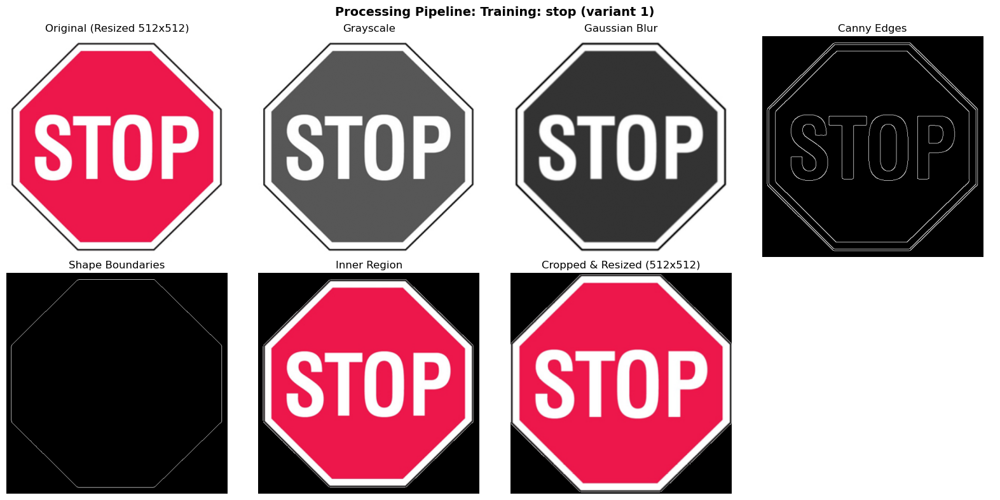

 Processed: stop - variant 1


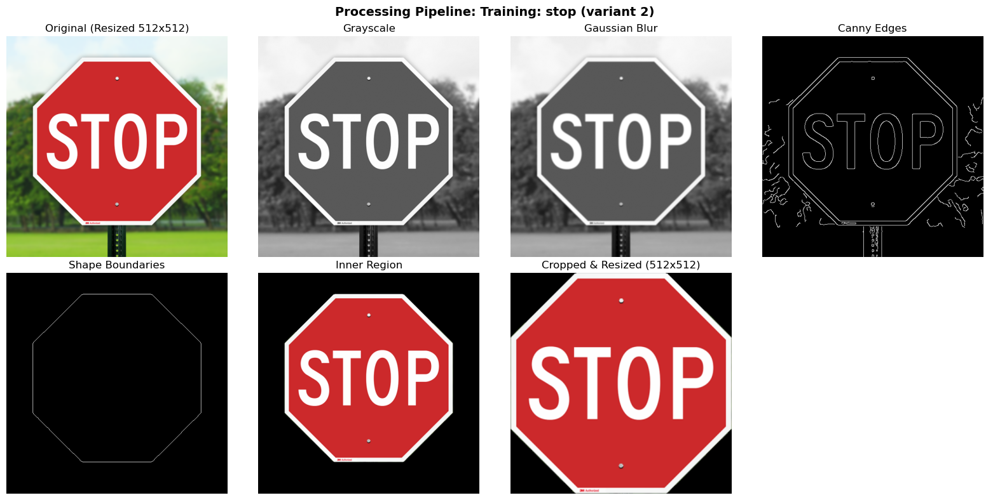

 Processed: stop - variant 2


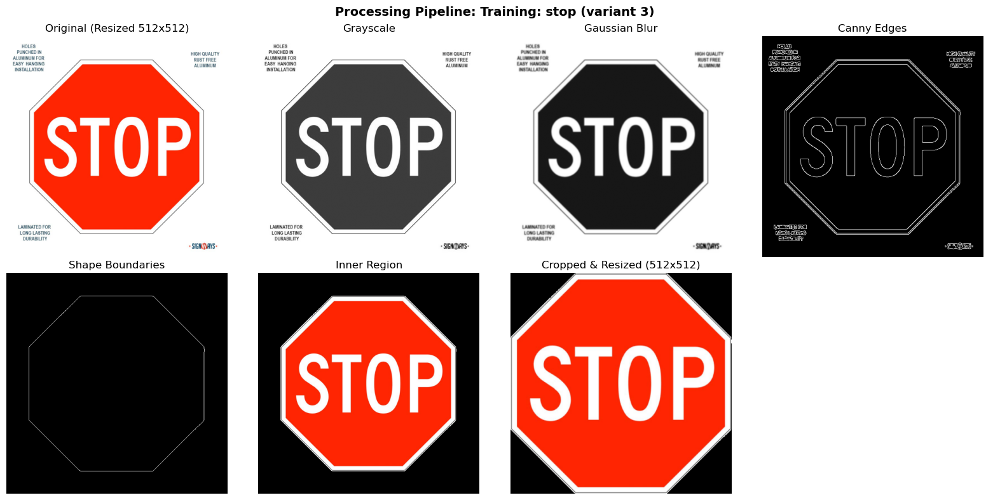

 Processed: stop - variant 3
 Class stop: 3 variants processed

Processing class: limit1


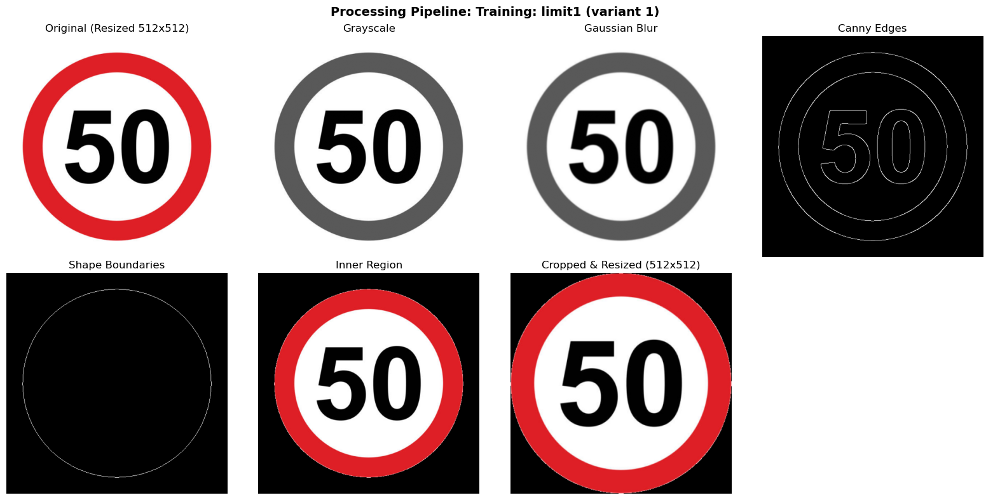

 Processed: limit1 - variant 1


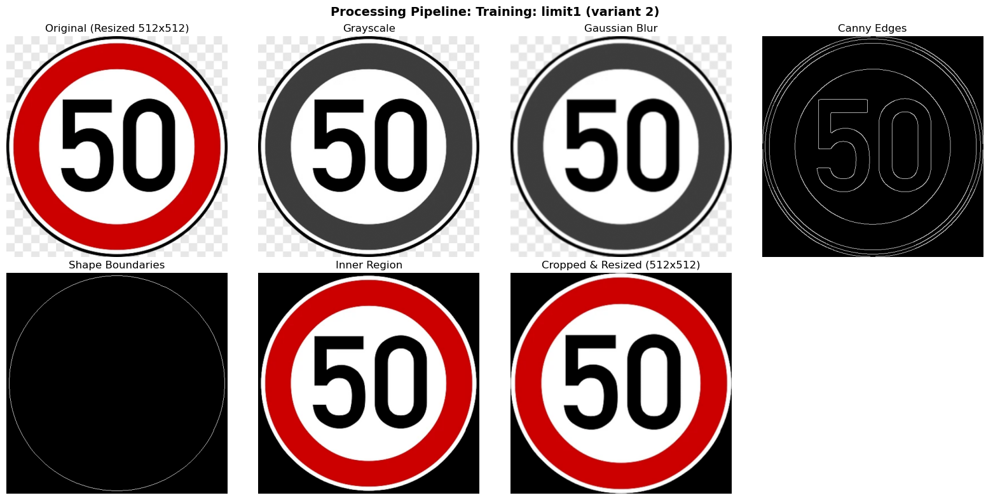

 Processed: limit1 - variant 2


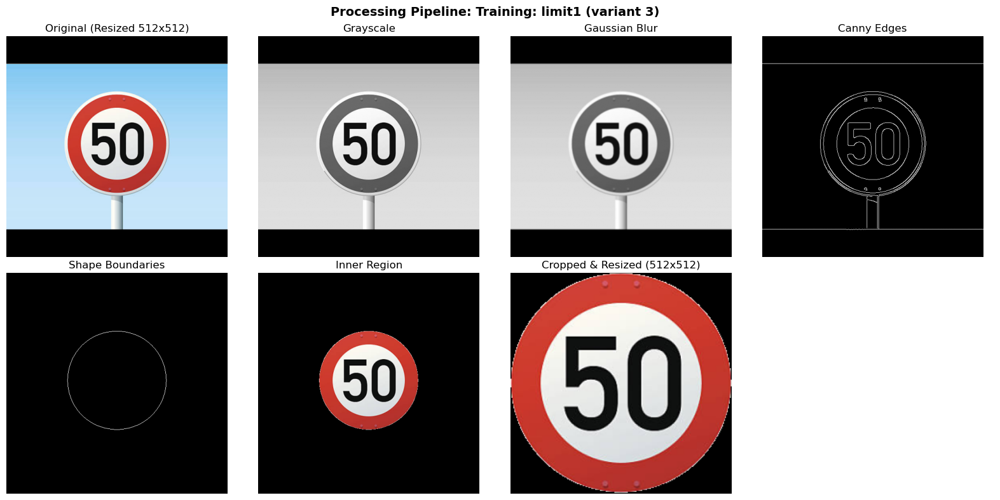

 Processed: limit1 - variant 3
 Class limit1: 3 variants processed

Processing class: limit2


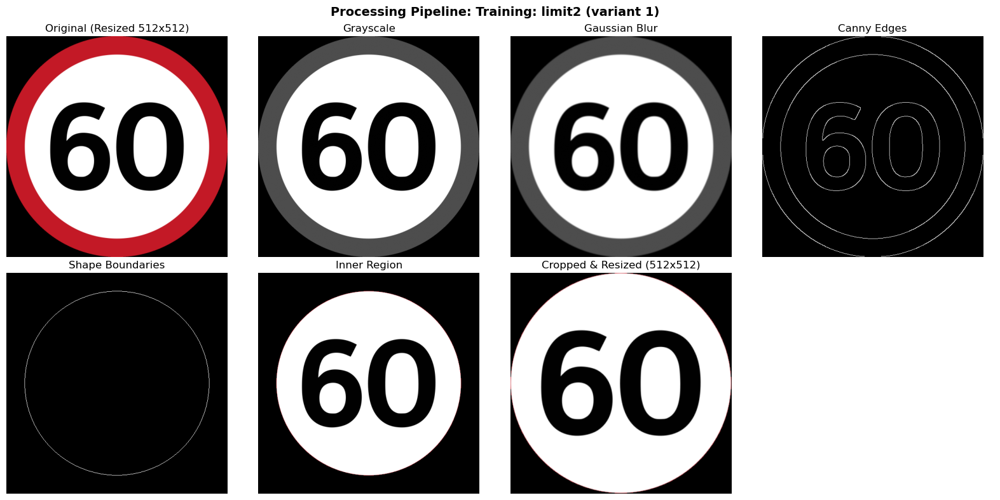

 Processed: limit2 - variant 1


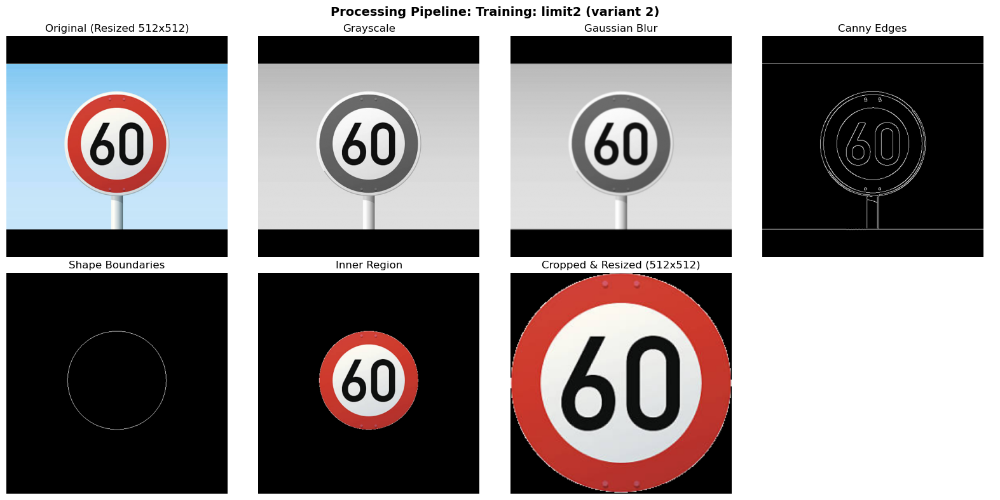

 Processed: limit2 - variant 2


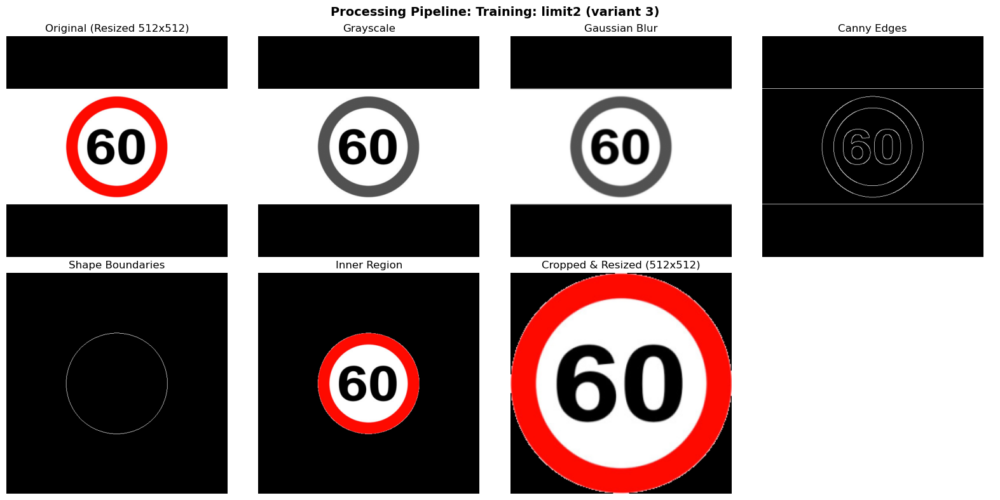

 Processed: limit2 - variant 3
 Class limit2: 3 variants processed

Processing class: limit3


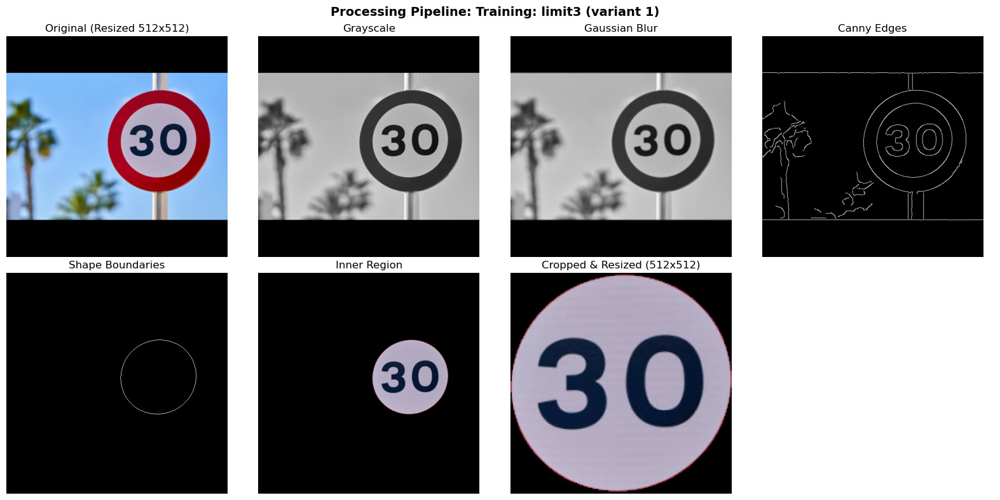

 Processed: limit3 - variant 1


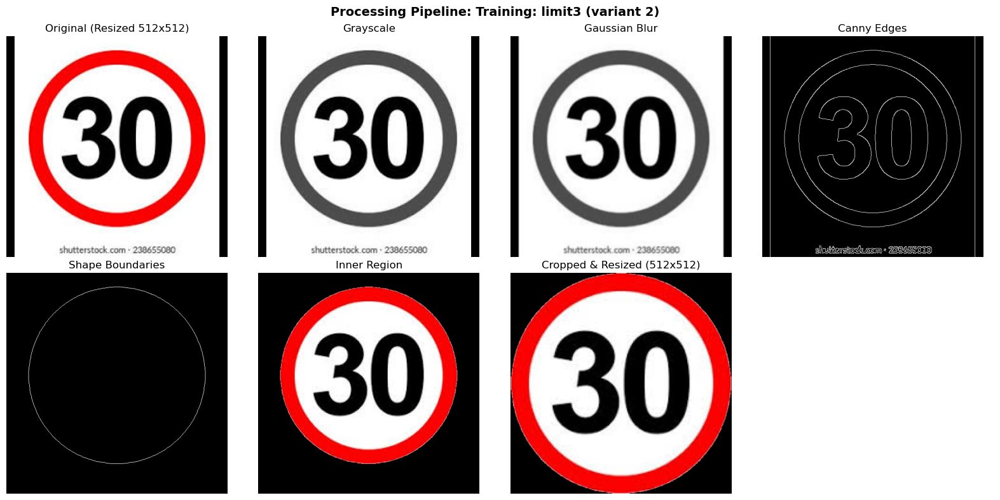

 Processed: limit3 - variant 2


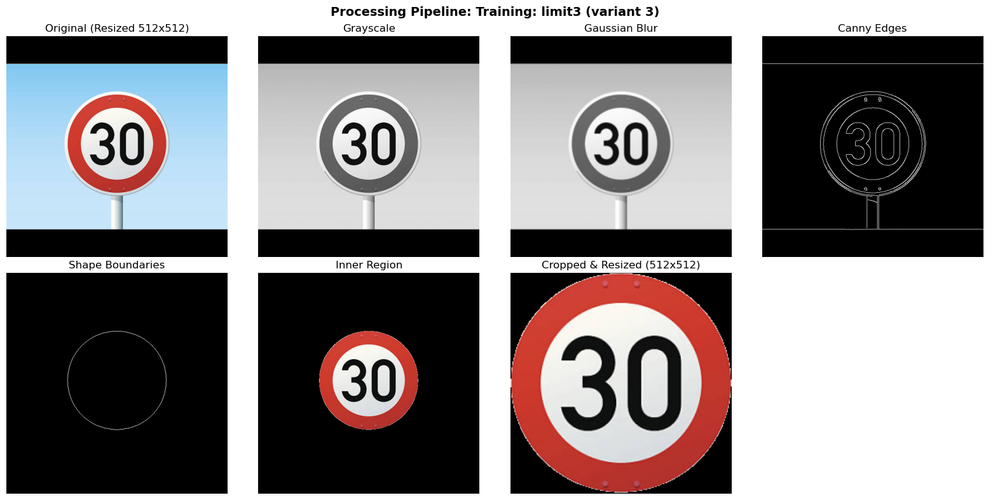

 Processed: limit3 - variant 3
 Class limit3: 3 variants processed

Processing class: no_parking


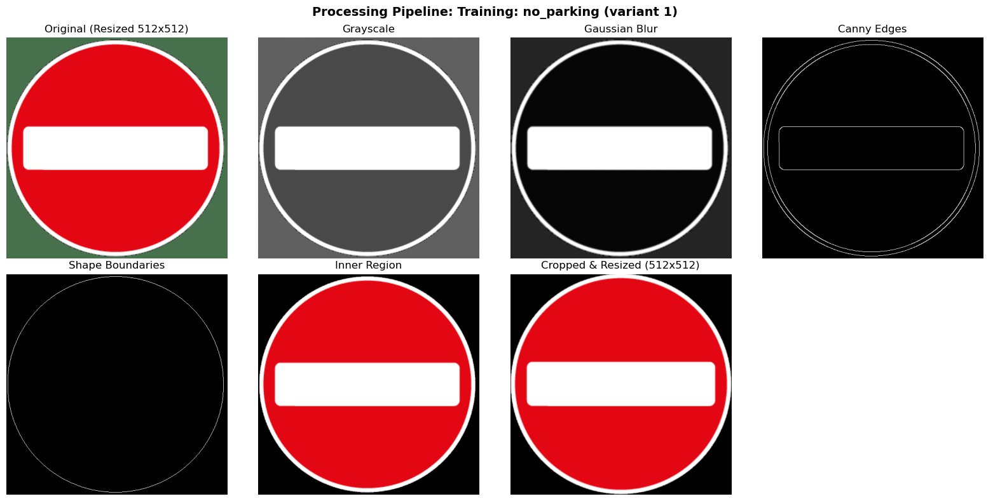

 Processed: no_parking - variant 1


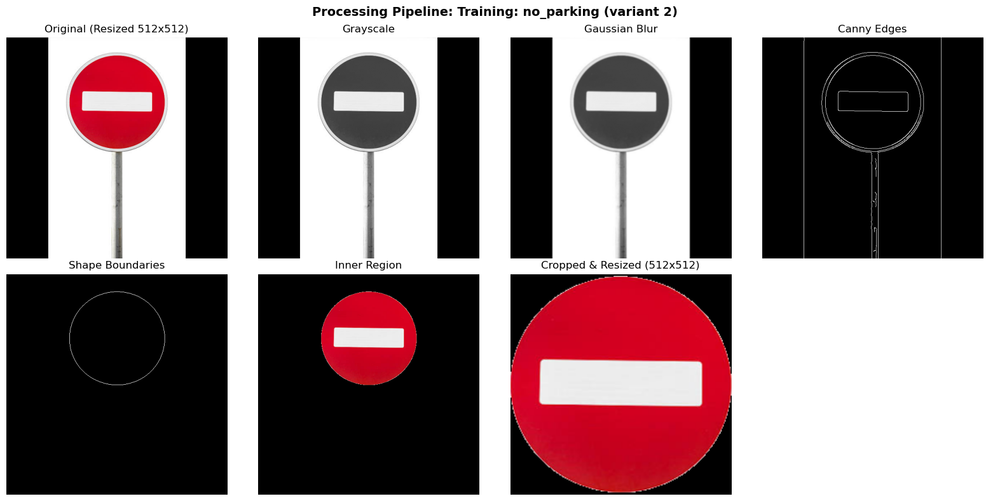

 Processed: no_parking - variant 2


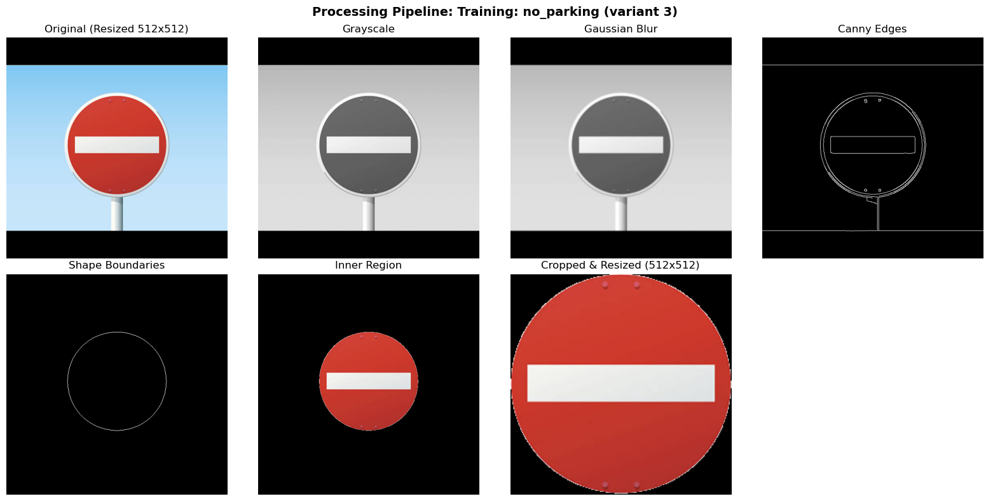

 Processed: no_parking - variant 3
 Class no_parking: 3 variants processed

Processing class: pedestrain


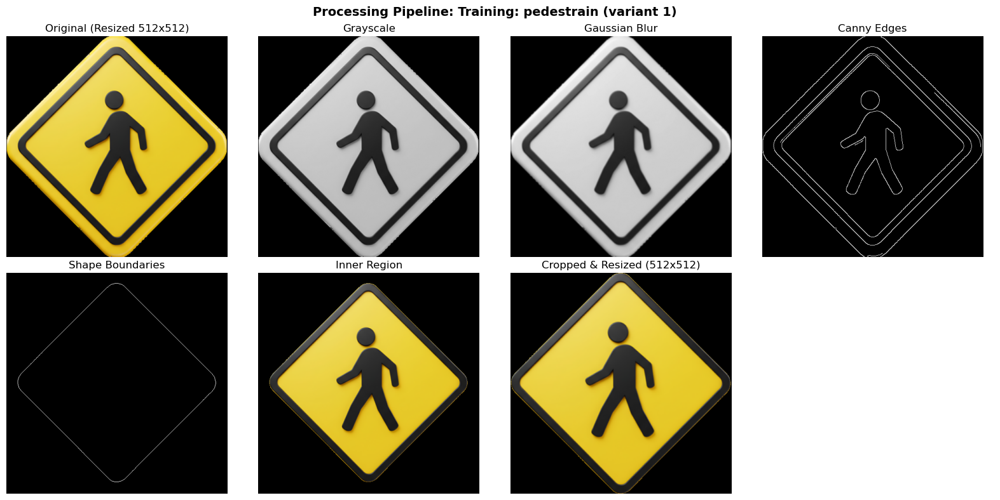

 Processed: pedestrain - variant 1


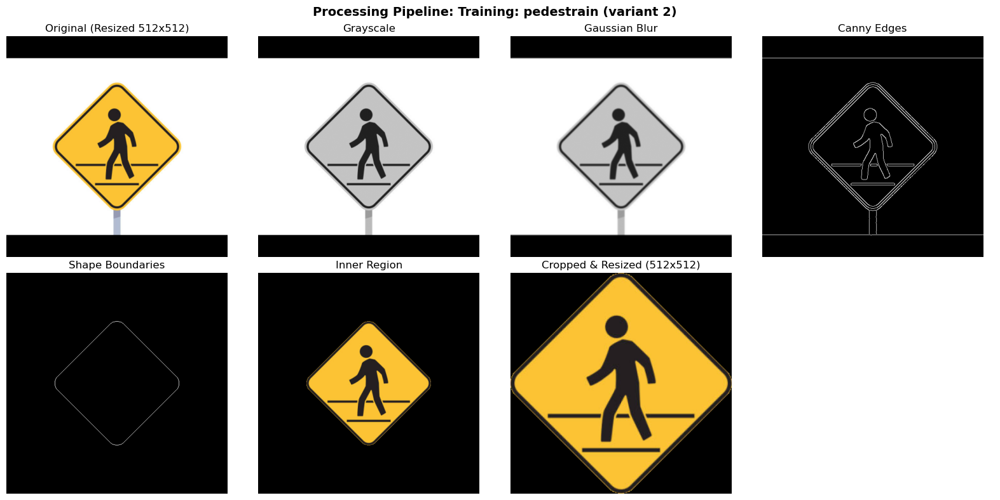

 Processed: pedestrain - variant 2


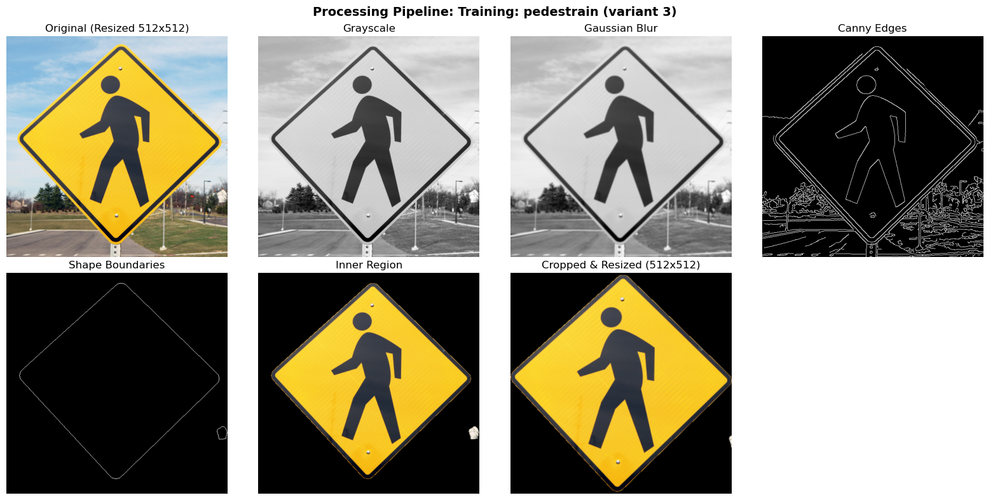

 Processed: pedestrain - variant 3
 Class pedestrain: 3 variants processed

Processing class: caution


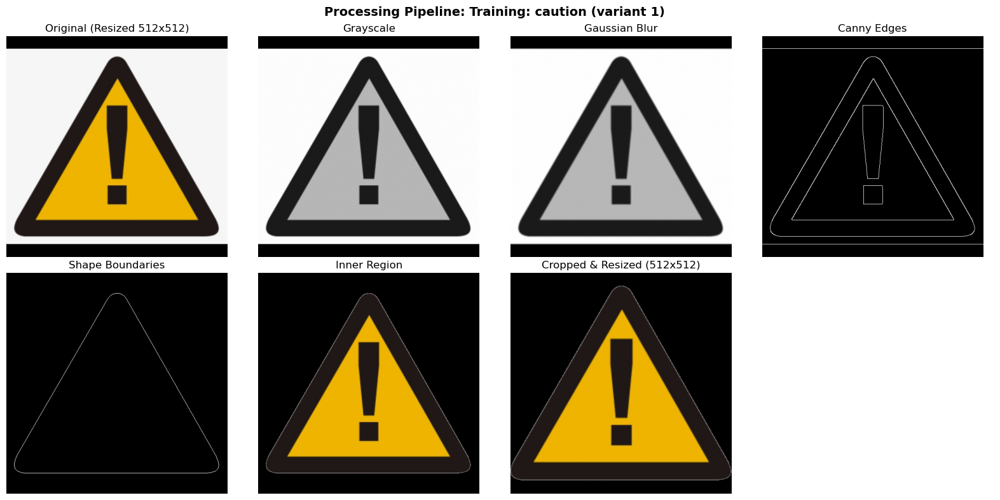

 Processed: caution - variant 1


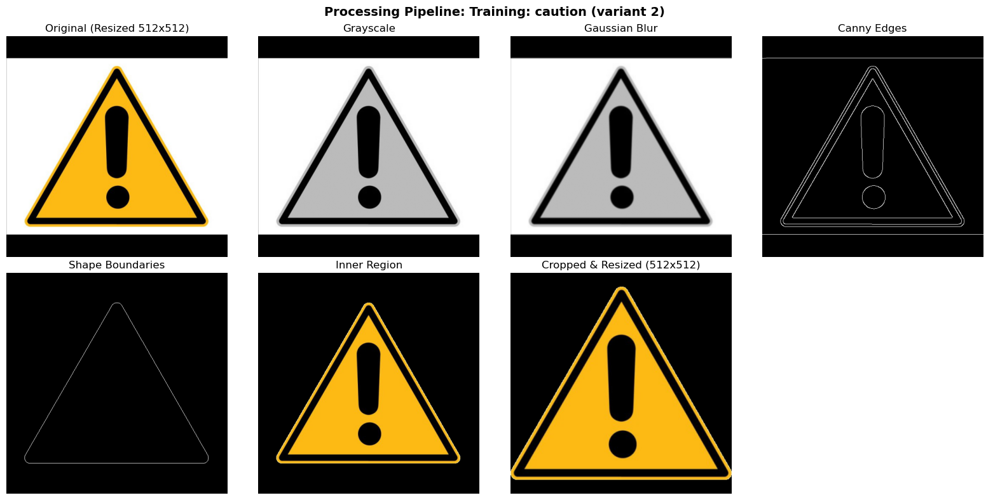

 Processed: caution - variant 2


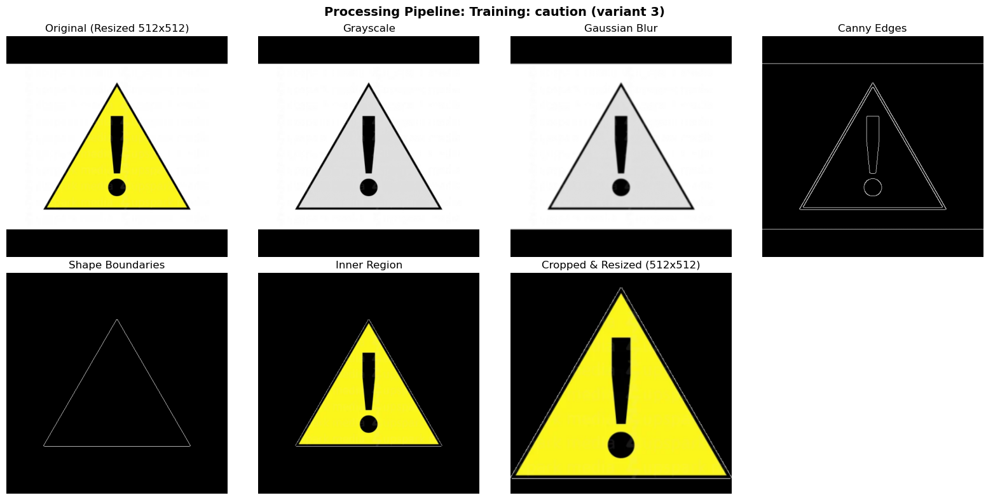

 Processed: caution - variant 3
 Class caution: 3 variants processed


In [10]:
training_images = {
    'stop': ['train/stop.jpg', 'train/stop_2.png', 'train/stop_3.jpg'],
    'limit1': ['train/limit1.jpg', 'train/limit1_2.jpg', 'train/limit1_3.jpg'],
    'limit2': ['train/limit2.png', 'train/limit2_2.jpg', 'train/limit2_3.jpg'],
    'limit3': ['train/limit3.jpg', 'train/limit3_2.jpg', 'train/limit3_3.jpg'],
    'no_parking': ['train/nop.png', 'train/nop_2.jpg', 'train/nop_3.jpg'],
    'pedestrain': ['train/pedes.png', 'train/pedes_2.jpg', 'train/pedes_3.jpg'],
    'caution': ['train/caution.jpg', 'train/caution_2.jpg', 'train/caution_3.jpg'],
}

print("=" * 60)
print("TRAINING PHASE")
print("=" * 60)

training_images_processed = {}
training_names = list(training_images.keys())

for name, paths in training_images.items():
    processed_variants = []
    print(f"\nProcessing class: {name}")
    
    for idx, path in enumerate(paths, 1):
        try:
            cropped = process_image_pipeline(path, plot_intermediate=True, 
                                            title=f"Training: {name} (variant {idx})")
            processed_variants.append(cropped)
            print(f" Processed: {name} - variant {idx}")
        except Exception as e:
            print(f" Error processing {name} variant {idx}: {e}")
            # Continue even if one variant fails
    
    if processed_variants:
        training_images_processed[name] = processed_variants
        print(f" Class {name}: {len(processed_variants)} variants processed")
    else:
        print(f" Class {name}: No variants successfully processed!")



TESTING PHASE


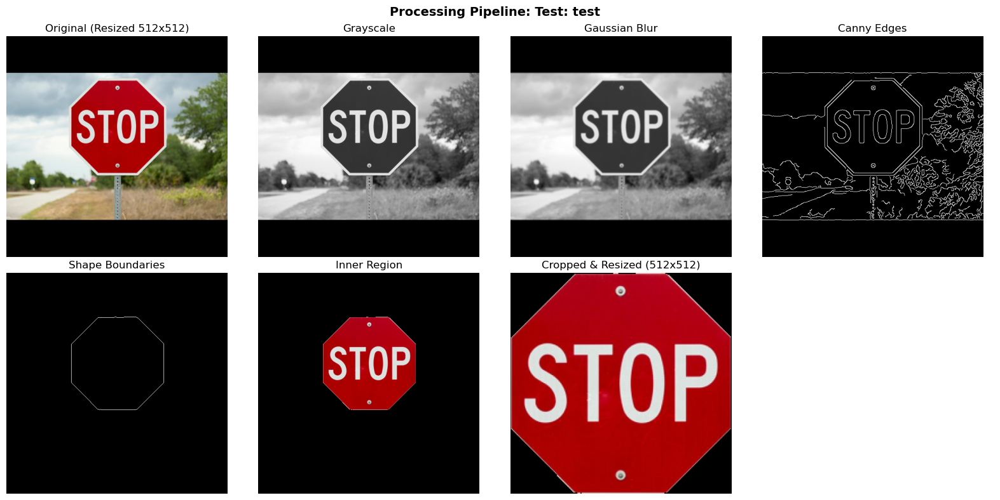

Template matching test against training images:
  stop: 0.2536 (variant 3)
  limit1: 0.0961 (variant 1)
  limit2: 0.1377 (variant 3)
  limit3: 0.0938 (variant 3)
  no_parking: 0.1278 (variant 3)
  pedestrain: 0.0000 (variant 1)
  caution: 0.0035 (variant 3)
Showing best matching variants for each class


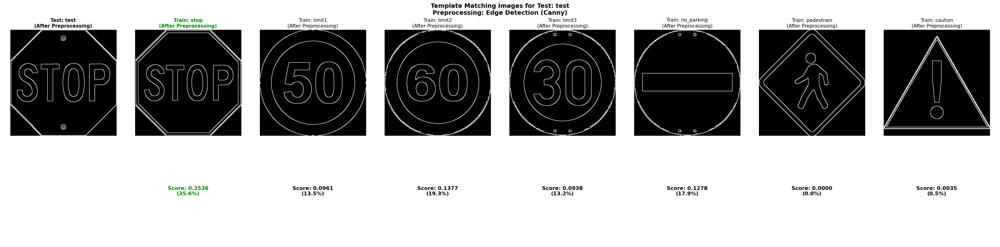

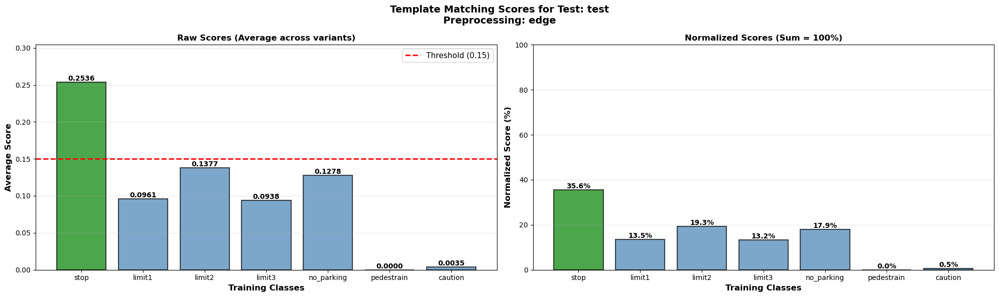


 test => stop (35.6%, score: 0.2536)



In [11]:
test_images = {
    'test': 'train/test1.jpg',
}

# Processing test images and compare with TEMPLATE MATCHING
print("\n" + "=" * 60)
print("TESTING PHASE")
print("=" * 60)


PREPROCESSING_METHOD = 'edge'  
USE_HISTOGRAM_MATCHING = False  
USE_STRUCTURAL_SIMILARITY = False  
THRESHOLD = 0.15  

results_table = []
matching_results = []

for test_name, test_path in test_images.items():
    try:
        test_cropped = process_image_pipeline(
            test_path, plot_intermediate=True, title=f"Test: {test_name}"
        )
        
# Calculating template matching scores with all training images
        scores = []
        train_grays = []
        best_variant_indices = []
        test_gray = None
        
        print(f"Template matching {test_name} against training images:")
        for train_name, train_image_variants in training_images_processed.items():
            best_score_for_class = 0
            best_gray_for_class = None
            best_variant_idx = 0
            
            for variant_idx, train_variant in enumerate(train_image_variants):
                if USE_STRUCTURAL_SIMILARITY:
                    score = structural_similarity_score(test_cropped, train_variant)
                else:
                    score, _, _ = template_match(test_cropped, train_variant, 
                                                prep_method=PREPROCESSING_METHOD,
                                                use_histogram_matching=USE_HISTOGRAM_MATCHING)
                
                if score > best_score_for_class:
                    best_score_for_class = score
                    best_variant_idx = variant_idx
            
            # Now getting the preprocessed images for the best variant
            best_variant = train_image_variants[best_variant_idx]
            if USE_STRUCTURAL_SIMILARITY:
                _, t_gray, tr_gray = template_match(test_cropped, best_variant, 
                                                    prep_method=PREPROCESSING_METHOD,
                                                    use_histogram_matching=USE_HISTOGRAM_MATCHING)
            else:
                _, t_gray, tr_gray = template_match(test_cropped, best_variant, 
                                                    prep_method=PREPROCESSING_METHOD,
                                                    use_histogram_matching=USE_HISTOGRAM_MATCHING)
            
            scores.append(best_score_for_class)
            train_grays.append(tr_gray)
            best_variant_indices.append(best_variant_idx)
            
            if test_gray is None:
                test_gray = t_gray
            
            print(f"  {train_name}: {best_score_for_class:.4f} (variant {best_variant_idx + 1})")
        
        # Normalizing scores to percentages (sum to 100%)
        scores_array = np.array(scores)
        if scores_array.sum() > 0:
            normalized_scores = (scores_array / scores_array.sum()) * 100
        else:
            normalized_scores = np.zeros_like(scores_array)
        
        best_idx = np.argmax(normalized_scores)  
        best_score = scores[best_idx]
        best_normalized_score = normalized_scores[best_idx]
        best_class = training_names[best_idx]
        best_variant = best_variant_indices[best_idx]
        is_match = best_score > THRESHOLD
        
        # Plotting the preprocessed images used for matching
        print(f"Showing best matching variants for each class")
        plot_matching_images(test_name, test_gray, training_names, train_grays, 
                           scores, normalized_scores, best_idx, PREPROCESSING_METHOD, USE_HISTOGRAM_MATCHING)
        
        plot_score_comparison(test_name, training_names, scores, normalized_scores, best_idx, 
                            THRESHOLD, PREPROCESSING_METHOD, USE_HISTOGRAM_MATCHING)
        
        row = [test_name]
        for score, norm_score in zip(scores, normalized_scores):
            row.append(f'{score:.4f}\n({norm_score:.1f}%)')
        
        if is_match:
            matched_label = f"{best_class}\n({best_normalized_score:.1f}%)"
            result = f" {test_name} => {best_class} ({best_normalized_score:.1f}%, score: {best_score:.4f})"
            row.append(matched_label)
        else:
            result = f" {test_name} => NO MATCH (best: {best_class} {best_normalized_score:.1f}%, score: {best_score:.4f})"
            row.append("NO MATCH")
        
        results_table.append(row)
        matching_results.append({
            'test_name': test_name,
            'matched': is_match,
            'match_class': best_class if is_match else "Unknown",
            'normalized_score': best_normalized_score,
            'raw_score': best_score
        })
        
        print(f"\n{result}\n")
        
    except Exception as e:
        print(f" Error processing test image {test_name}: {e}")
        import traceback
        traceback.print_exc()


In [12]:
print("\n" + "=" * 60)
print("MATCHING SUMMARY")
print("=" * 60)
print(f"Method: {'Structural Similarity' if USE_STRUCTURAL_SIMILARITY else 'Template Matching'}")
print(f"Preprocessing: {PREPROCESSING_METHOD}")
print(f"Histogram Matching: {'ENABLED' if USE_HISTOGRAM_MATCHING else 'DISABLED'}")
print(f"Threshold: {THRESHOLD}")
print(f"Total Tests: {len(matching_results)}")
matches_found = sum(1 for r in matching_results if r['matched'])
print(f"Matches Found: {matches_found}")
print(f"No Match: {len(matching_results) - matches_found}")
print()

for result in matching_results:
    status = "MATCH" if result['matched'] else " NO MATCH"
    print(f"  {status} | {result['test_name']} => {result['match_class']} ({result['normalized_score']:.1f}%, raw: {result['raw_score']:.4f})")


MATCHING SUMMARY
Method: Template Matching
Preprocessing: edge
Histogram Matching: DISABLED
Threshold: 0.15
Total Tests: 1
Matches Found: 1
No Match: 0

  MATCH | test => stop (35.6%, raw: 0.2536)
